# How to utilize Generative Models
___

이 실습자료는 2024 세종과학예술영재학교 인문예술주간 강연 How to utilize Generative Models 강연 (강연자: 강태원) 에 사용되는 실습자료입니다.

PPT에서 다뤘던 두 생성모델인 Image-to-Image Diffusion 그리고 Image-to-Video Diffusion 생성 모델을 직접 실제로 테스트해 볼 것입니다. 여러 생성모델을 테스트해보고, 자신의 프로젝트에 가장 잘 맞는 생성모델을 찾으셔서 좋은 작품을 만들어가시면 좋겠습니다.

여러 생성모델들을 테스트해 본 결과, 본교 GPGPU 서버를 포함한 현실적인 GPU 리소스 문제 그리고 실행 가능한 코드 등 여러 가지 요소를 고려하여 강의에서는 크게 Generative Model 중 Image-to-Image, Image-to-Video task를 수행하는 Diffusion Model을 다루고자 합니다. 두 모델의 역할은 다음과 같습니다.

*   Image-to-Image Diffusion: 원본 이미지와 문장(프롬포트)이 주어졌을 때, 원본 이미지를 문장에 맞추어 변형한 새로운 이미지를 생성함
*   Image-to-Video Diffusion: 원본 이미지와 문장(프롬포트)이 주어졌을 때, 원본 이미지를 문장에 맞추어 변형한 새로운 비디오를 생성함

조금 생소하게 느껴질 수 있습니다만, 제목에서 언급했듯이 여러분이 해야할 일은 알고리즘을 이해하는 것보단 **이 알고리즘을 어떻게 이틀동안 활용(utilize)해서 독창적인 결과를 만들지에 대해서만 중점적으로 고민**해 주시면 됩니다.

예를 들어, Image-to-Video Diffusion 모델을 활용하면 이미지와 가이드를 주는 프롬포트를 활용해 비디오를 제작할 수 있기에 움직이는 사진을 Diffusion Model로 제작하실 수 있으실 겁니다. (시중에 움직이는 그림책도 있죠?) 우리 학교에 있는 정지된 미술작품들을 움직이도록 만드는 방향이 하나의 아이디어가 될 수 있습니다. (실험 결과에 따라 정지된 미술작품 내 캐릭터만 움직이는 스토리텔링도 구현해 볼 수 있을 듯 합니다)

여러분이 실험을 하면서 겪을 수 있는 시행착오는 제가 최대한 배제해두었습니다. 우선 앞에서 언급한 두 알고리즘에 대해서는 실행 가능한 코드를 제가 확보해두었고, 그 코드는 여러분의 Google Colab 무료버전으로 에러수정 없이 편리하게 실행하여 결과를 확인할 수 있도록 제가 설계해두었습니다. 또한 모두 사전에 학습된 모델(pre-trained model) 이 있기에 학습과정이 따로 필요 없고, 바로 결과도출을 진행하므로 Generative Model 학습에 걸리는 시간에 대한 부담이나 불안감 또한 없을 것입니다.

## **Python 실습**

아래는 강의자료에서 다루었던 코드입니다.

(1) 문자열을 출력할 때, 따옴표로 감싸서 출력을 합니다. 따옴표로 감싸면, 자료형이 문자열(str) 이 됩니다. ‘Hello World’ 라는 문자열을 출력합니다.

In [ ]:
print('Hello World!')

(2) 이를 응용해서, 여러 개의 자료를 출력할 수 있습니다.여러 개의 자료는 쉼표(,) 로 구분합니다!

In [ ]:
print("Hello", "SASA!")

(3) print() 를 여러 번 사용하면, 한 줄에 하나씩 자료를 출력할 수 있습니다.

In [ ]:
print("Hello")
print("World")

(4) 문자열 자료형(str) 에서의 덧셈과 곱셈은 각각 결합, 반복 연산으로 표현됩니다. 즉, 서로 다른 자료형을 서로 결합하거나, 안녕을 n번 곱하는 연산이 가능합니다.

In [ ]:
print("안녕"*2)
print("안녕"+"하세요")

(1) 숫자를 출력할 때 따옴표를 감싸지 않습니다. 따옴표를 감싸지 않으면, 자료형이 정수(int)로 표현됩니다. 단순 12라는 숫자를 출력합니다.

(2) 따옴표를 감싸지 않으면, 문자열(str)이 아닌 숫자(int)로 취급되므로, 사칙연산이 가능합니다. (+, -, *, / 등)

In [ ]:
print(12)

# 아래와 같은 사칙연산이 가능
print(12+4)
print(12-4)
print(12*4)
print(12/4)

In [ ]:
print(13/4) # 13을 4로 나눈 결과
print(13//4) # 13을 4로 나눈 몫
print(13%4) # 13을 4로 나눈 나머지

In [ ]:
print(12**4) # 12^4 = 12*12*12*12

In [ ]:
a = 3
b = "ABC"
c = b*a
print(a)

(1) 컴퓨터에게 자료를 전달하는 코드는 `input()` 입니다.
입력받은 자료는 어디에 보관해야 하는데, 보관하는 공간을 변수라고 합니다.
변수는 변하는 수라는 뜻으로, 자료를 저장하는 공간을 직접 만들어 줄 수 있습니다.
`변수 = input()` 의 형식으로 사용자의 키보드 입력을 변수에 담아보세요.

In [ ]:
a = input()
print(a)

(2) 기본적으로 input() 으로 입력받은 값은 문자열(str)로 저장됩니다.
숫자를 입력받아 사칙연산을 하고 싶다면 자료형 변환을 해 주어야 합니다.
str() 자료형을 int() 로 변환하기 위하여, int() 로 input()을 감싸주세요.

아래 예시는 사용자의 나이를 입력받아 성인(만 19세) 이 되려면 몇년이 남았는지
구하는 코드입니다.

In [ ]:
a = int(input())
print(19-a)

python에서는 `if`를 사용하여 조건을 정합니다.
`if` 뒤에 조건을 써주고, 조건이 참(True) 인 경우 아래 명령을 실행합니다.
그 아랫줄에 들여쓰기를 해서 명령을 써 줍니다.

In [ ]:
a = int(input()) # 숫자를 입력해 보세요.
if a > 5: # a가 5 초과인 경우 (6부터) 값을 출력함.
    print(a)

(2) 조건에 해당되지 않아도 명령을 실행할 수 있습니다.
조건에 해당되지 않는지 검사하는 명령이 `else` 문입니다.
`else`문은 위에 명시한 `if`문의 조건에 해당하지 않을 때 실행됩니다.

ex) 아래 코드는 절대값을 구하는 코드의 예시입니다.

In [ ]:
a = int(input()) # 숫자를 입력해 보세요.
# 입력한 숫자의 절대값을 구합니다.
if a > 0:
    print(a)
else:
    print(-1*a)

(2) 꼭 `if`문의 조건에 해당되지 않아도 다른 조건을 검사할 수 있습니다.
`if`문 조건에 해당되지 않았을 때 다른 조건으로 검사하는 명령이 `elif` 문입니다.
`elif`문은 위에 명시한 `if`문의 조건에 해당하지 않을 때 실행되고,
만약 모든 조건에 해당되지 않는 경우 `else`문을 추가할 수 있습니다. (선택)

In [ ]:
score = int(input()) # 숫자를 입력해 보세요.
# 입력한 점수를 바탕으로 성적을 구합니다.

if score >= 95: # 95~100
    print("A+")
elif score >= 90: # 90~94
    print("A0")
else: # 90 미만
    print("B+")

python의 반복문에는 일정한 범위 내에서 반복하는 for문과, 조건이 참인 동안 반복하는 while문이 있습니다.

In [ ]:
for i in [1,2,3]:
    print(i)

'''
(1) 리스트의 범위를 조절하여 반복 횟수를 결정할 수 있습니다.
여러 개의 자료를 담는 자료형을 리스트라 하고, 다음과 같이 구성됩니다.
a = [1, 2, 3, 4, 5]

리스트에는 인덱스가 있으며, 0부터 시작합니다. ex) a[1] # 2

현재 이 코드에서는 1, 2, 3을 순서대로 리스트에서 빼내 i 변수에 넣고,
3번 반복하며 i를 각 반복에서 출력하고 있습니다.
실행 결과:
1
2
3
'''

In [ ]:
i = 0
while i < 5:
    print(i)
    i += 1

'''
(2) while문은 조건이 참인 동안 계속 반복됩니다.
i가 5보다 작은 경우까지 반복되므로,
i값은 0, 1, 2, 3, 4까지 출력되고  반복문을 빠져나오게 됩니다.
'''

### Assignment

배운 내용을 기반으로 아래 과제를 해결해봅시다. (15min)

In [ ]:
'''
문제 01. 출력하기
다음 내용을 출력한다.
공백을 포함한 다음 문장을 출력하시오.

Hello, SASA!
Hello, World!
'''

# 이곳 아래에 코드를 작성하세요.
# ===========================================================================
# TODO 1. 내용 출력하기

In [ ]:
'''
문제 02. 출력하기
변수에 문자 1개를 저장한 후 변수에 저장되어 있는 문자를 그대로 출력하시오.

입력 예시:
a
출력 예시:
a
'''

# 이곳 아래에 코드를 작성하세요.
# ===========================================================================
# TODO 1. 변수에 문자 1개를 저장하기

# ===========================================================================
# TODO 2. 변수에 저장되어 있는 문자를 출력하기

In [ ]:
'''
문제 03. 내 나이
만 나이 기준으로 나이를 입력받았을 때, 성인이 되려면 몇 년이 남았는지를 구하시오.

입력 예시:
12

출력 예시:
7

참고로 민법상 성년은 만 19세이다.
'''

# 이곳 아래에 코드를 작성하세요.
# ===========================================================================
# TODO 1. 만 나이를 기준으로 정수형(int) 로 나이를 입력받음

# ===========================================================================
# TODO 2. 성인 나이(만 19세) - 만 나이로 성인이 되려면 몇 년이 남았는지를 구하여 출력하기

In [ ]:
'''
문제 04. 계산기 만들기

사칙연산 계산기를 만드시오.
두 수의 덧셈, 뺄셈, 곱셈, 나눗셈을 개행(Enter) 으로 구분하여 출력한다.

입력 예시:
1
2

출력 예시:
3
-1
2
0.5
'''

# 이곳 아래에 코드를 작성하세요.
# ===========================================================================
# TODO 1. 입력 받기
a = ???
b = ???
# ===========================================================================
# TODO 2. 계산 결과 구하기
print(a + b) # a와 b를 덧셈한 결과를 출력합니다.
print(a ??? b) # a와 b를 뺄셈한 결과를 출력합니다.
print(a ??? b) # a와 b를 곱셈한 결과를 출력합니다.
print(a ??? b) # a와 b를 나눗셈한 결과를 출력합니다.

In [ ]:
'''
문제 05. 약수 구하기

어떤 수 a를 다른 수 b로 나누었을 때 나머지가 0이라면 a는 b로 나누어 떨어진다고 하며 b는 a의 약수라고 한다. 두 자연수 a와 b가 주어졌을 때, b가 a의 약수인지 아닌지 검사하는 프로그램을 만들어라.

두 수 a와 b가 개행(Enter) 으로 구분하여 입력된다.
단, b는 a보다 항상 작거나 같다.

이 경우, b가 a의 약수이면 True를 출력해 주고,
그렇지 않다면, a를 b로 나누었을 때의 나머지를 출력한다. 약수인 경우 나머지는 0이 된다.
'''

# 이곳 아래에 코드를 작성하세요.
# ===========================================================================
# TODO 1. 정수(int) 형태로 입력 받기
n = ???
m = ???
# ===========================================================================
# TODO 2. n과 m의 나머지를 구하는 코드를 작성
d = ???

# ===========================================================================
# TODO 3. n과 m의 나머지가 0이라면 약수! 약수가 아니라면 n을 m으로 나누었을 때의 나머지 출력!
?? ? == 0:
    print("True")
????:
    print(d)

In [ ]:
'''
문제 06. 소수 판별

약수를 사용하여 소수인지를 판단하는 프로그램을 작성해 보자.
소수란, 1 보다 큰 자연수 중 1 과 자기 자신을 제외하고 약수가 존재하지 않는 수를 의미한다.
예를 들어 7 의 약수는 1 과 7 뿐이므로 소수이다.
자연수 n이 입력되었을 때, n이 소수인지 아닌지 판별하여 출력하라.

소수는 1과 자기자신만을 약수로 가지는 수를 의미한다.
반대로 생각하면, 2 부터 n−1 까지의 수들 중 하나라도 약수로 가진다면 소수가 아니다.

입력 예시 1
13

출력 예시 1
Yes

입력 예시 2
12

출력 예시 2
No
'''

# 이곳 아래에 코드를 작성하세요.
# ===========================================================================
# TODO 1. 정수(int) 형태로 입력 받기
n = int(input())
flag = True # flag가 True면 소수이고, 반복문 중 False로 바뀌면 소수가 아닙니다.

# ===========================================================================
# TODO 2. 반복문을 사용해서 소수인지 아닌지 판별하기
??? i in range(2, n): # range 함수를 쓰면 2부터 n-1까지의 범위에서 반복을 할 수 있습니다!
    ?? n % i == 0:
        flag = False
# ===========================================================================
# TODO 3. flag를 사용해서 소수인지 아닌지 점검하기! flag가 True면 소수이고, 반복문 중 False로 바뀌면 소수가 아닙니다.
?? flag == True:
    print("Yes")
????:
    print("No")

## **Initialize**

먼저, 이미지나 비디오 등 Diffusion Model에서 필요한 pre-trained model을 불러오는 `diffusers` 라이브러리를 설치하도록 합니다.

In [ ]:
!pip install diffusers["torch"] transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.4/302.4 kB 19.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylin

설치가 완료되면 아래 예제를 따라해 봅시다.

## **Stable Diffusion XL (Image-to-Image with prompt)**

SDXL(Stable Diffusion XL)은 기존 Stable Diffusion과 비교하여 더 짧고 간단한 프롬프트를 사용하면서 realistic한 얼굴, 이미지 내에서 읽을 수 있는 text, 더 나은 image를 생성할 수 있는 Generative Model입니다.

Colab 무료버전 (T4 GPU) 기준 이미지 생성에 **20-30초** 정도 소요됩니다.

In [ ]:
import torch

from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

원본 이미지와 Prompt를 입력받습니다.

In [ ]:
# prepare image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-sdxl-init.png"
init_image = load_image(url)

prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

이미지를 생성하고 그 결과를 시각화합니다.

  0%|          | 0/25 [00:00<?, ?it/s]

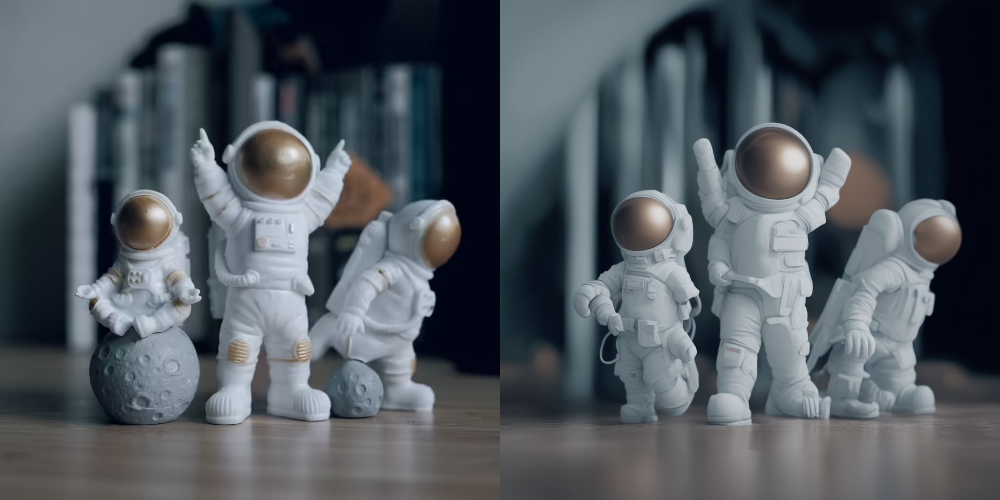

In [ ]:
# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, strength=0.5).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

⚠️ 다음 실험을 돌리기 위해 GPU 메모리를 정리합니다. **Google Colab 무료버전에 할당된 GPU 리소스는 많이 없기에 최대한 많은 리소스를 확보해야만 합니다**. 이때, `gc` 라이브러리를 활용하여 메모리를 정리하도록 합시다.

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

### **Strength**

📈 `strength` 값이 높을수록 모델에 더 많은 "창의성" 이 부여되어 초기 이미지와 다른 이미지를 생성할 수 있습니다. `strength=1.0` 은 초기의 Input 이미지가 어느 정도 무시됨을 의미합니다.

📉 `strength` 값이 낮을수록 생성된 이미지가 초기 이미지와 더 유사하다는 의미입니다.

⚠️ **해당 파라미터의 범위는 0 이상 1 이하로 하셔야 합니다.**

`strength` 파라미터를 바꾸어서 모델 결과를 도출해 봅시다.

  0%|          | 0/35 [00:00<?, ?it/s]

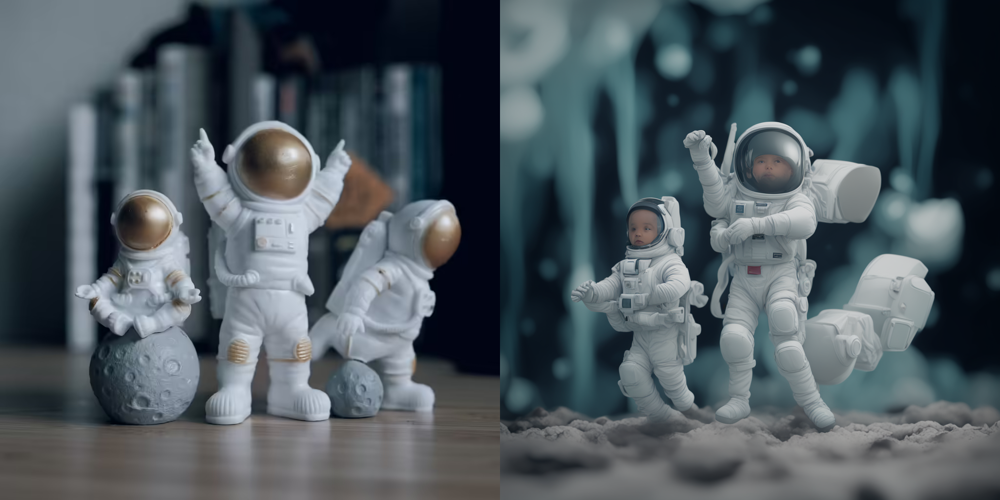

In [ ]:
# strength=0.7
image = pipeline(prompt, image=init_image, strength=0.7).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

  0%|          | 0/50 [00:00<?, ?it/s]

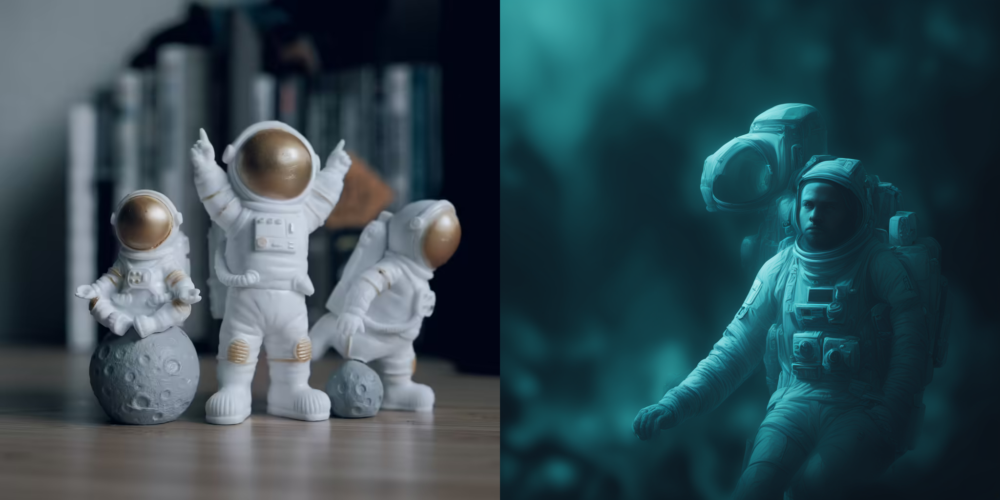

In [ ]:
# strength=1.0
image = pipeline(prompt, image=init_image, strength=1.0).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

gc.collect()
torch.cuda.empty_cache()

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

### **Guidance scale**

`guidance_scale` 은 생성된 이미지 그리고 텍스트가 어떻게 가깝게 align되는지 제어를 하기 위해 사용되는 파라미터입니다.

📈 `guidance_scale` 값이 높을수록 생성된 이미지가 프롬포트(Text)와 더 알맞게 제작됩니다.

📉 `guidance_scale` 값이 낮을수록 이미지를 생성하는데 있어 더 창의성을 발휘할 수 있습니다. 즉 Text에 구애받기 보다는 Generative Model의 독창성을 더 보장한다고 이해할 수 있습니다.

⚠️ **최소 1 이상의 파라미터 값을 넣으셔야 합니다.**

⚠️ `strength`는 0.7로 고정하여 `guidance_scale` 파라미터가 이미지 생성에 어떠한 영향을 주는지 정확히 확인해보도록 합시다.

⚠️ 실험을 할 때는 어떠한 경우에도 **절대로 여러 파라미터를 한번에 바꿔서 결과를 보시면 안 됩니다.** 그 이유는 **어떤 파라미터가 제일 적절한지에 대해 파라미터별로 판단을 하기 어렵기 때문**입니다. 운 좋게 실험결과가 잘 나와도 **왜 이 파라미터를 써야 하는지 근거에 대해 분석하기 어렵게 됩니다**.

  0%|          | 0/35 [00:00<?, ?it/s]

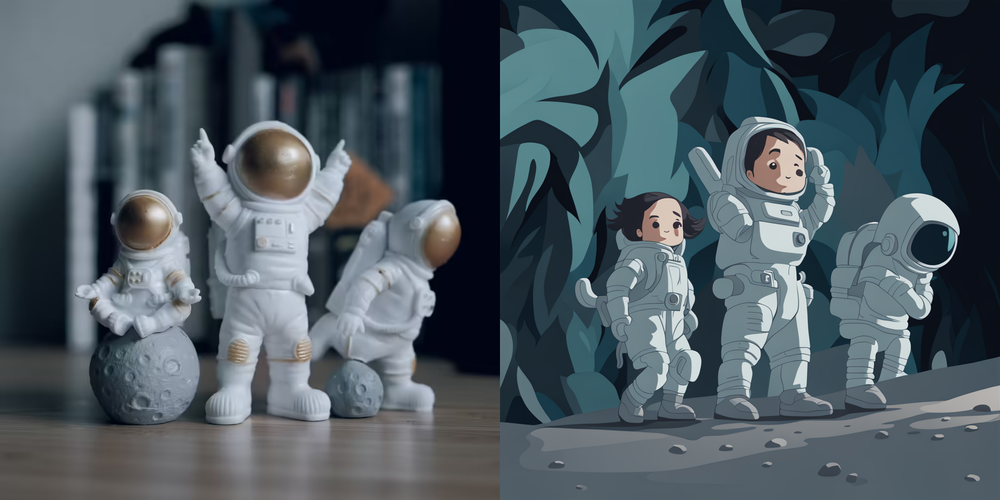

In [ ]:
# guidance_scale=10.0
image = pipeline(prompt, image=init_image, strength=0.7, guidance_scale=10.0).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

  0%|          | 0/35 [00:00<?, ?it/s]

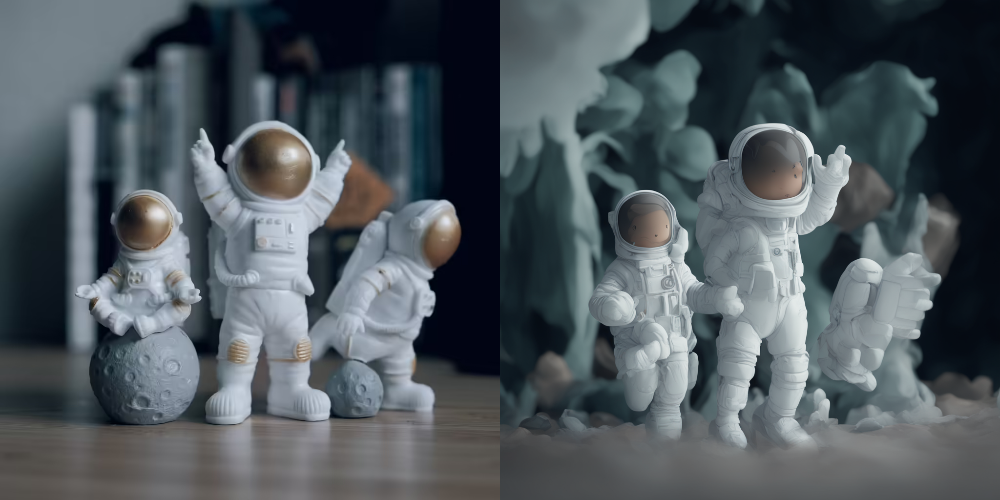

In [ ]:
# guidance_scale=3.0
image = pipeline(prompt, image=init_image, strength=0.7, guidance_scale=3.0).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

  0%|          | 0/35 [00:00<?, ?it/s]

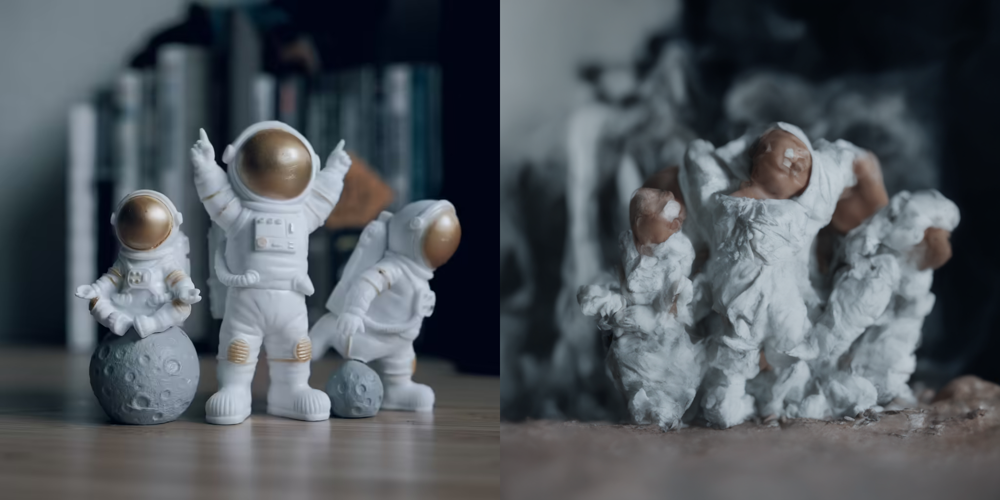

In [ ]:
# guidance_scale=1.0
image = pipeline(prompt, image=init_image, strength=0.7, guidance_scale=1.0).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

### **Negative prompt**

이미지에 포함되면 **안 되는 부정적인 요소들이** 무엇인지 키워드를 포함하여 이미지의 퀄리티를 향상시킬 수 있습니다. 모델이 높은 품질의 Image를 생성하도록 하기 위해 Stable Diffusion 모델은 해당 프롬포트를 참고하게 됩니다.

어렸을 적 부모님께 야단맞아보신 적이 있으시죠? 그러면 학생분들은 야단맞을 행동을 하지 않으려 할 것이고요. 비슷한 원리입니다.

⚠️ 참고로 부정의 부정은 긍정입니다. 즉, 못생긴 캐릭터를 만들기 원하지 않는다면 "못생긴(ugly)" 만 쓰시면 됩니다. Negative Prompt에 Not ugly를 넣으시면 의도하는 결과를 만들기 어렵게 됩니다.

⚠️ 실험을 돌릴 때, `strength`는 0.7로 고정하고, `guidance_scale`는 10.0으로 고정하여 Negative Prompt가 이미지 생성에 어떠한 영향을 주는지 정확히 확인해보도록 합시다.

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

원본 이미지를 불러옵니다.

In [ ]:
# prepare image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"
init_image = load_image(url)

`negative_prompt = "ugly, deformed, disfigured, poor details, bad anatomy"` 의 실행 결과를 구해 봅시다.

  0%|          | 0/35 [00:00<?, ?it/s]

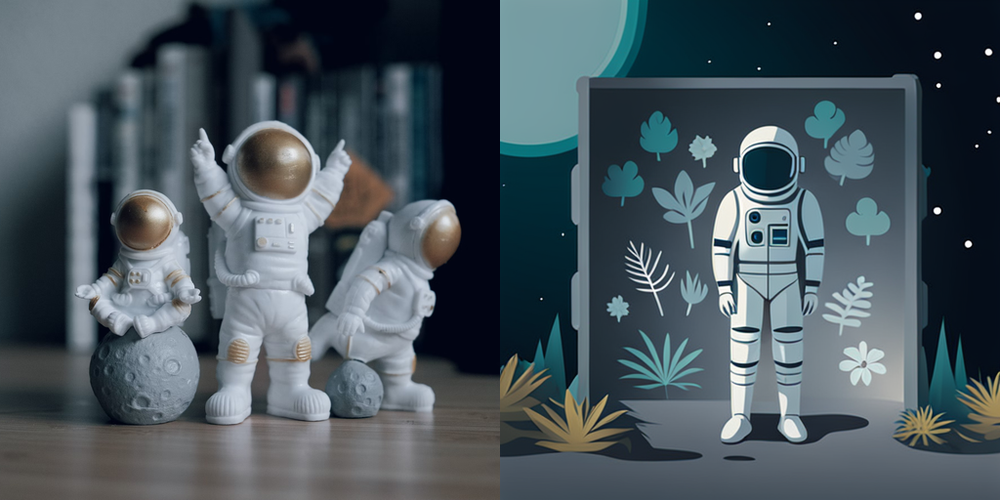

In [ ]:
prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"
negative_prompt = "ugly, deformed, disfigured, poor details, bad anatomy" # 못생긴, 기형의, 훼손된, 세부 사항이 불량한, 해부학적으로 잘못된

# pass prompt and image to pipeline
image = pipeline(prompt, negative_prompt=negative_prompt, image=init_image, strength=0.7, guidance_scale=10.0).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

`negative_prompt = "jungle"` 의 실행 결과를 구해 봅시다.

  0%|          | 0/35 [00:00<?, ?it/s]

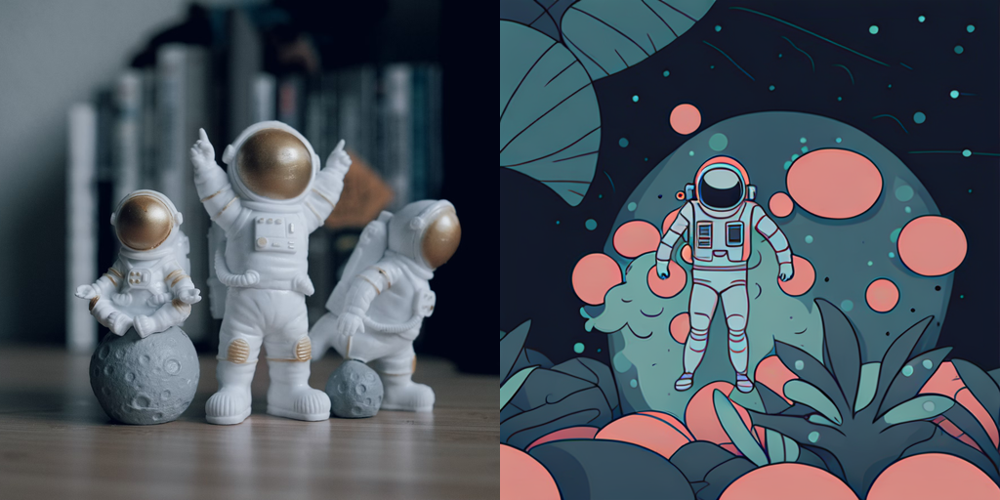

In [ ]:
prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"
negative_prompt = "jungle" # 정글

# pass prompt and image to pipeline
image = pipeline(prompt, negative_prompt=negative_prompt, image=init_image, strength=0.7, guidance_scale=10.0).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

### **StableDiffusionXL 실습**

그럼, 지금부터 `???` 칸을 자유롭게 변경하여 원본 이미지를 바탕으로 새로운 이미지를 생성해봅시다.

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()

url = "???" # 이미지의 링크 또는 경로를 입력합니다. content 폴더 안에 넣은 경우 이미지 파일명을 쓰시면 됩니다.
init_image = load_image(url)

prompt = "???" # prompt 입력
negative_prompt = "???" # negative prompt 입력

# pass prompt and image to pipeline
image = pipeline(prompt, negative_prompt=negative_prompt, image=init_image, strength=0.7, guidance_scale=10.0).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

## **I2VGen-XL (Image-to-Video with prompt)**

I2VGen-XL 모델은 이미지와 프롬포트(텍스트) 가 입력되었을 때 그 이미지와 텍스트에 맞는 비디오를 새롭게 생성하는 모델입니다.

가령, 이미지가 입력되고 텍스트에 비디오의 방향을 지정해 주면, 움직이는 이미지(즉, 비디오) 를 만드는 작업이 가능합니다.

I2VGen-XL 모델은 Stable Video Diffusion (SVD) 에서 **더 나아가 고해상도의 비디오를 만들 수 있으며**, SVD와 다르게 **텍스트 프롬포트를 받아서 그 프롬포트에 알맞은 비디오를 만드는 작업**을 할 수 있습니다.

⚠️ **주의사항:** Colab 일반 버전의 경우 **T4 GPU**를 사용하여야 하고, 일반적으로 영상을 생성하는데 **12-18분**이 소요됩니다.

참고로 무료버전은 백그라운드 실행을 지원하지 **않으므로** **이 창을 항상 켜두고 GPU가 꺼지지 않는지 모니터링** 하셔야 합니다.

제작된 파일은 Google Colab 기준 **왼쪽 사이드바의 "파일" 디렉토리에서 확인**하실 수 있습니다.

먼저 필요한 라이브러리를 불러옵니다.

In [ ]:
import torch
from diffusers import I2VGenXLPipeline
from diffusers.utils import export_to_gif, load_image
import gc

Pre-trained Model 그리고 Prompt, Negative Prompt를 입력받습니다.

In [ ]:
pipeline = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16")
pipeline.enable_model_cpu_offload()

image_url = "https://huggingface.co/datasets/diffusers/docs-images/resolve/main/i2vgen_xl_images/img_0009.png"
image = load_image(image_url).convert("RGB")

prompt = "Papers were floating in the air on a table in the library"
negative_prompt = "Distorted, discontinuous, Ugly, blurry, low resolution, motionless, static, disfigured, disconnected limbs, Ugly faces, incomplete arms"
generator = torch.manual_seed(8888)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

GIF 파일을 생성합니다. 이 코드에서 원본 이미지가 비디오로 변환되게 됩니다.

⚠️ `guidance_scale` 파라미터는 1 이상으로 하셔야 합니다. `guidance_scale` 그리고 `negative_prompt`의 의미는 기존에 배운 내용과 같습니다. `inference_steps` 파라미터를 증가시키는 것이 결과를 좋게 만들 수 있는 가능성이 있지만, 리소스 문제로 Google Colab 무료버전에서는 50을 사용하시는 것을 강력 권장드립니다.

In [ ]:
frames = pipeline(
    prompt=prompt,
    image=image,
    num_inference_steps=50,
    negative_prompt=negative_prompt,
    guidance_scale=9.0,
    generator=generator
).frames[0]
export_to_gif(frames, "i2v.gif")

gc.collect()
torch.cuda.empty_cache()

  0%|          | 0/50 [00:00<?, ?it/s]

생성된 GIF 파일을 시각화해 봅시다.

In [ ]:
from PIL import Image
from IPython.display import Image

In [ ]:
Image(open('i2v.gif', 'rb').read())

움직이는 아이언맨을 구현해 봅시다. 자세한 설명은 강의자료에 언급되어 있습니다. 아이언맨 이미지를 움직이도록 해 봅시다.

In [ ]:
import torch
from diffusers import I2VGenXLPipeline
from diffusers.utils import export_to_gif, load_image
import gc

pipeline = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16")
pipeline.enable_model_cpu_offload()

image_url = "ironman.png"
image = load_image(image_url).convert("RGB")

prompt = "Iron Man jumps"

negative_prompt = ""
generator = torch.manual_seed(8888)

frames = pipeline(
    prompt=prompt,
    image=image,
    num_inference_steps=50,
    negative_prompt=negative_prompt,
    guidance_scale=9.0,
    generator=generator
).frames[0]
export_to_gif(frames, "ironman.gif")

gc.collect()
torch.cuda.empty_cache()

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/555 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/507 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

image_encoder/config.json:   0%|          | 0.00/563 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/601 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/706M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/637 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/627 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/2.84G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

'i2v5.gif'

벌떡 일어나는 고양이를 구현해 봅시다. 자세한 설명은 강의자료에 있습니다.

In [ ]:
import torch
from diffusers import I2VGenXLPipeline
from diffusers.utils import export_to_gif, load_image
import gc

pipeline = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16")
pipeline.enable_model_cpu_offload()

image_url = "bj_kim_desk.png"
# ref: https://www.facebook.com/photo.php?fbid=7486222964750215&set=pb.100000877582090.-2207520000&type=3
image = load_image(image_url).convert("RGB")

prompt = "The cat woke up."

negative_prompt = ""
generator = torch.manual_seed(8888)

frames = pipeline(
    prompt=prompt,
    image=image,
    num_inference_steps=50,
    negative_prompt=negative_prompt,
    guidance_scale=9.0,
    generator=generator
).frames[0]
export_to_gif(frames, "bj_kim_desk.gif")

gc.collect()
torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Snowy Wonderland 안에 있는 세종과학예술영재학교를 구현해 봅시다. 자세한 설명은 강의자료에 있습니다.

In [ ]:
import torch
from diffusers import I2VGenXLPipeline
from diffusers.utils import export_to_gif, load_image
import gc

pipeline = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16")
pipeline.enable_model_cpu_offload()

image_url = "sasa_winter.png"
image = load_image(image_url).convert("RGB")

prompt = "Generate snowy wonderland"

negative_prompt = "building, ice wall"
generator = torch.manual_seed(8888)

frames = pipeline(
    prompt=prompt,
    image=image,
    num_inference_steps=50,
    negative_prompt=negative_prompt,
    guidance_scale=9.0,
    generator=generator
).frames[0]
export_to_gif(frames, "sasa_winter.gif")

gc.collect()
torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

단양에 있는 패러글라이더는 원래 하강하죠? 이번에는 상승하는 패러글라이더를 만들어보겠습니다. 자세한 설명은 강의자료에 있습니다.

In [ ]:
import torch
from diffusers import I2VGenXLPipeline
from diffusers.utils import export_to_gif, load_image
import gc

pipeline = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16")
pipeline.enable_model_cpu_offload()

image_url = "danyang.png"
image = load_image(image_url).convert("RGB")

prompt = "The paraglider ascends"

negative_prompt = ""
generator = torch.manual_seed(8888)

frames = pipeline(
    prompt=prompt,
    image=image,
    num_inference_steps=50,
    negative_prompt=negative_prompt,
    guidance_scale=9.0,
    generator=generator
).frames[0]
export_to_gif(frames, "danyang.gif")

gc.collect()
torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

### **TMI. I2VGen으로** `꽁꽁 얼어붙은 한강 위로 고양이가 걸어다닙니다` **를 구현해 봅시다.**

참고로 해당 그림의 출처는 `꽁꽁 얼어붙은 한강 위로 고양이가 걸어다닙니다` 를 [1시간 동안 재생하는 영상](https://www.youtube.com/watch?v=OZz5ilE7RJ8)입니다.

In [ ]:
import torch
from diffusers import I2VGenXLPipeline
from diffusers.utils import export_to_gif, load_image
import gc

pipeline = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16")
pipeline.enable_model_cpu_offload()

image_url = "https://i.ytimg.com/vi/OZz5ilE7RJ8/maxresdefault.jpg"
# ref: https://www.youtube.com/watch?v=OZz5ilE7RJ8
image = load_image(image_url).convert("RGB")

prompt = "The cat walks across the frozen river"

negative_prompt = ""
generator = torch.manual_seed(8888)

frames = pipeline(
    prompt=prompt,
    image=image,
    num_inference_steps=50,
    negative_prompt=negative_prompt,
    guidance_scale=9.0,
    generator=generator
).frames[0]
export_to_gif(frames, "kongkong_cat.gif")

gc.collect()
torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

### I2VGen-XL 실습

그럼, 지금부터 `???` 칸을 자유롭게 변경하여 원본 이미지를 바탕으로 원하는 비디오를 생성해봅시다.

In [ ]:
import torch
from diffusers import I2VGenXLPipeline
from diffusers.utils import export_to_gif, load_image
import gc

pipeline = I2VGenXLPipeline.from_pretrained("ali-vilab/i2vgen-xl", torch_dtype=torch.float16, variant="fp16")
pipeline.enable_model_cpu_offload()

image_url = "???" # 이미지의 링크 또는 경로를 입력합니다. content 폴더 안에 넣은 경우 이미지 파일명을 쓰시면 됩니다.
image = load_image(image_url).convert("RGB")

prompt = "???" # Prompt를 입력합니다.

negative_prompt = "" # Negative Prompt를 입력합니다.
generator = torch.manual_seed(8888)

# 필요한 경우 하단의 파라미터를 변경하셔도 좋습니다.
frames = pipeline(
    prompt=prompt,
    image=image,
    num_inference_steps=50,
    negative_prompt=negative_prompt,
    guidance_scale=9.0,
    generator=generator
).frames[0]
export_to_gif(frames, "output.gif")

gc.collect()
torch.cuda.empty_cache()

## LICENSE

<font color='red'><b>**WARNING**</b></font> : 본 실습자료의 무단전재와 복사, 배포, 상업적인 용도의 이용을 금지합니다.